## Face R-FCN Widerface Face Detection - Inspect Trained Model

Code and visualizations to test, debug, and evaluate the Face R-FCN model.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath(".")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from KerasRFCN import Utils
from KerasRFCN import Visualize
from KerasRFCN.Visualize import display_images
import KerasRFCN.Model.Model as modellib
from KerasRFCN import Data_generator
import WiderFace
%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
MODEL_PATH = os.path.join(ROOT_DIR, "logs/widerface20190501T0052/Keras-RFCN_widerface_0084.h5")

Using TensorFlow backend.


In [2]:
def log(text, array=None):
    """Prints a text message. And, optionally, if a Numpy array is provided it
    prints it's shape, min, and max values.
    """
    if array is not None:
        text = text.ljust(25)
        text += ("shape: {:20}  ".format(str(array.shape)))
        if array.size:
            text += ("min: {:10.5f}  max: {:10.5f}".format(array.min(),array.max()))
        else:
            text += ("min: {:10}  max: {:10}".format("",""))
        text += "  {}".format(array.dtype)
    print(text)


## Notebook Preferences

In [3]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/gpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in inference mode
TEST_MODE = "inference"

In [4]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.

    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Load Validation Dataset

In [5]:
# Build validation dataset

dataset = WiderFace.WiderFaceDataset()
dataset.initDB(img_dir='C:/Data/WIDERFACE_Dataset/val/images',
                    annotation_file='C:/Data/WIDERFACE_Dataset/wider_face_split/wider_face_val_bbx_gt.txt')
dataset.prepare()


print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 3225
Classes: ['BG', 'Face']


## Configurations

In [6]:
config = WiderFace.RFCNNConfig()

In [7]:
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
C                              2
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  768
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
K                              3
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.00015
MAX_GT_INSTANCES               200
MEAN_PIXEL                     [123.7 116.8 103.9]
NAME                           WiderFace
NUM_CLASSES                    2
OHEM                           False
OHEM_HARD_EXAMPLES_SIZE        256
POOL_SIZE                

In [8]:
# Override the training configurations with a few
# changes for inferencing.
class InferenceConfig(config.__class__):
    # Run detection on one image at a time
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    #RPN_ANCHOR_SCALES = (16, 64, 128, 256, 512)
    #DETECTION_MIN_CONFIDENCE = 0.7
    
    
config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
C                              2
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.8
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  768
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
K                              3
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.00015
MAX_GT_INSTANCES               200
MEAN_PIXEL                     [123.7 116.8 103.9]
NAME                           WiderFace
NUM_CLASSES                    2
OHEM                           False
OHEM_HARD_EXAMPLES_SIZE        256
POOL_SIZE                

## Load Model

In [9]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.RFCN_Model(mode="inference", model_dir=MODEL_DIR,
                              config=config)

# Load weights
print("Loading weights ", MODEL_PATH)
model.load_weights(MODEL_PATH, by_name=True)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Use tf.cast instead.
Instructions for updating:
Use tf.cast instead.
Loading weights  D:\UB\Spring19\Biometrics\Project3\FaceRFCN\FaceRFCN\logs/widerface20190501T0052/Keras-RFCN_widerface_0084.h5


## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [29]:
image_id = random.choice(dataset.image_ids)
#image_id = 203
image_id = 2377
image, image_meta, gt_class_id, gt_bbox =\
    WiderFace.load_image_gt(dataset, config, image_id)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

image ID: Widerface.2377 (2377) 


In [30]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = Data_generator.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = Utils.apply_box_deltas(
    positive_anchors, target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -0.70168  max:    1.33956  float64
positive_anchors         shape: (3, 4)                min:  113.61633  max:  468.25578  float64
negative_anchors         shape: (253, 4)              min:  -16.00000  max: 1120.00000  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (3, 4)                min:  114.00001  max:  467.99997  float32


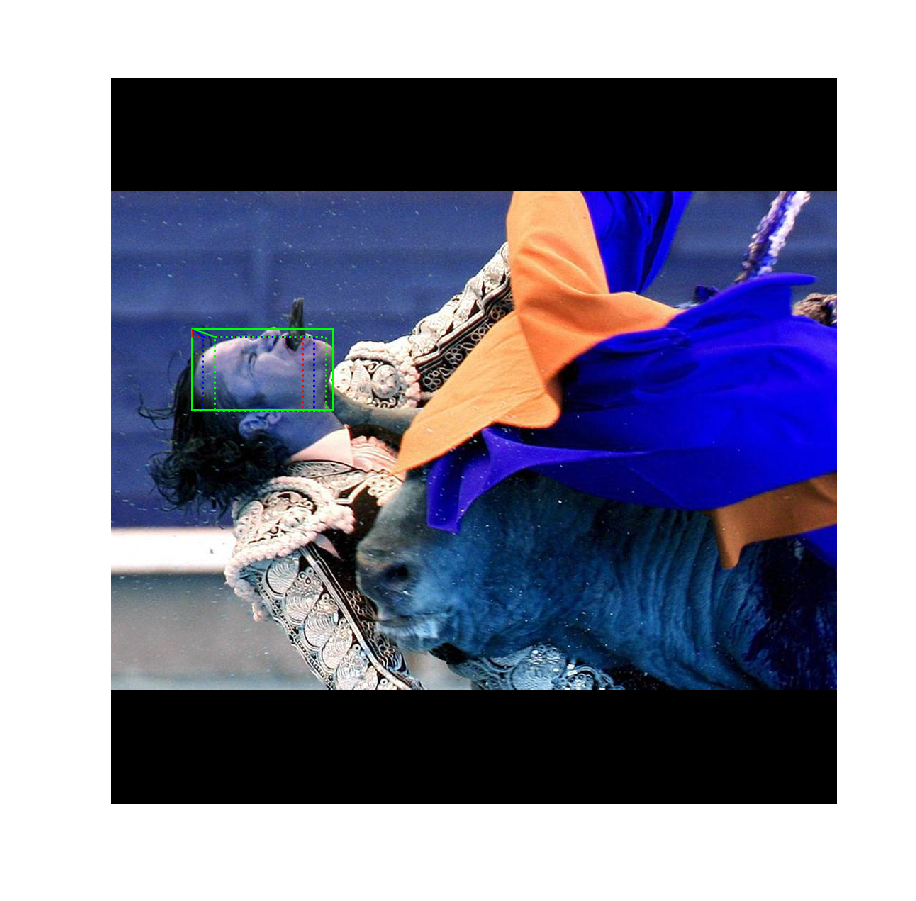

In [31]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
Visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

## Resnet Activations

In [32]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   10.42043  float32
rpn_bbox                 shape: (1, 261888, 4)        min: -181.87752  max:  170.70840  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


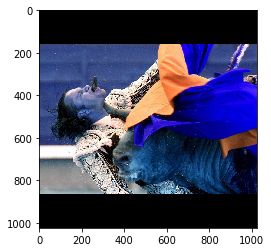

In [33]:
# Input image (normalized)
_ = plt.imshow(Utils.unmold_image(activations["input_image"][0],config))

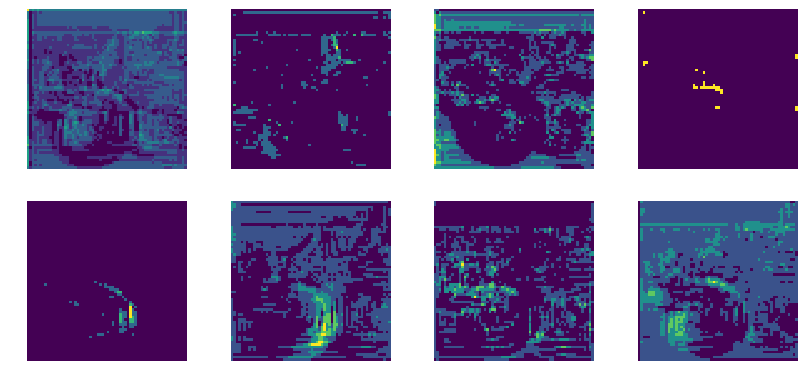

In [36]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,70:78], [2, 0, 1]))

## Feature Pyramid Network (FPN) Activations

In [30]:
activations1 = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("fpn_p2",          model.keras_model.get_layer("fpn_p2").output),
    ("fpn_p3",          model.keras_model.get_layer("fpn_p3").output),
    ("fpn_p4",          model.keras_model.get_layer("fpn_p4").output),
    ("fpn_p5",          model.keras_model.get_layer("fpn_p5").output),
    ("fpn_p6",          model.keras_model.get_layer("fpn_p6").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
fpn_p2                   shape: (1, 256, 256, 256)    min:  -32.53422  max:   27.17407  float32
fpn_p3                   shape: (1, 128, 128, 256)    min:  -24.72661  max:   21.15630  float32
fpn_p4                   shape: (1, 64, 64, 256)      min:  -15.05746  max:   20.44318  float32
fpn_p5                   shape: (1, 32, 32, 256)      min:  -17.89294  max:   16.22058  float32
fpn_p6                   shape: (1, 16, 16, 256)      min:  -16.32239  max:   15.17393  float32


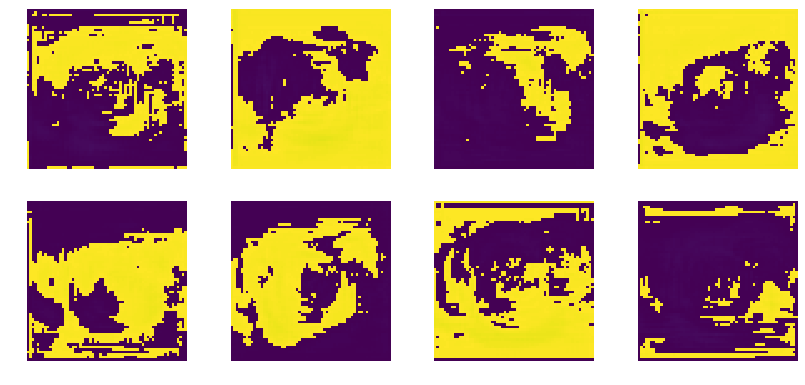

In [31]:
display_images(np.transpose(activations1["fpn_p4"][0,:,:,:8], [2, 0, 1]))

## FCN Scoremaps Activations

In [20]:
activations1 = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("class_0",          model.keras_model.get_layer("score_map_class_0").output),
    ("class_1",          model.keras_model.get_layer("score_map_class_1").output),
    ("class_2",          model.keras_model.get_layer("score_map_class_2").output),
    ("class_3",          model.keras_model.get_layer("score_map_class_3").output),
    ("regr_0",          model.keras_model.get_layer("score_map_regr_0").output),
    ("regr_1",          model.keras_model.get_layer("score_map_regr_1").output),    
    ("regr_2",          model.keras_model.get_layer("score_map_regr_2").output),
    ("regr_3",          model.keras_model.get_layer("score_map_regr_3").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
class_0                  shape: (1, 256, 256, 18)     min: -107.60786  max:  101.46378  float32
class_1                  shape: (1, 128, 128, 18)     min:  -29.67348  max:   40.10794  float32
class_2                  shape: (1, 64, 64, 18)       min:  -30.38224  max:   28.95745  float32
class_3                  shape: (1, 32, 32, 18)       min:  -16.37723  max:   13.38851  float32
regr_0                   shape: (1, 256, 256, 36)     min:  -18.13917  max:   22.65175  float32
regr_1                   shape: (1, 128, 128, 36)     min:  -15.87006  max:   19.56361  float32
regr_2                   shape: (1, 64, 64, 36)       min:  -17.83423  max:   18.84054  float32
regr_3                   shape: (1, 32, 32, 36)       min:  -10.20723  max:    8.67215  float32


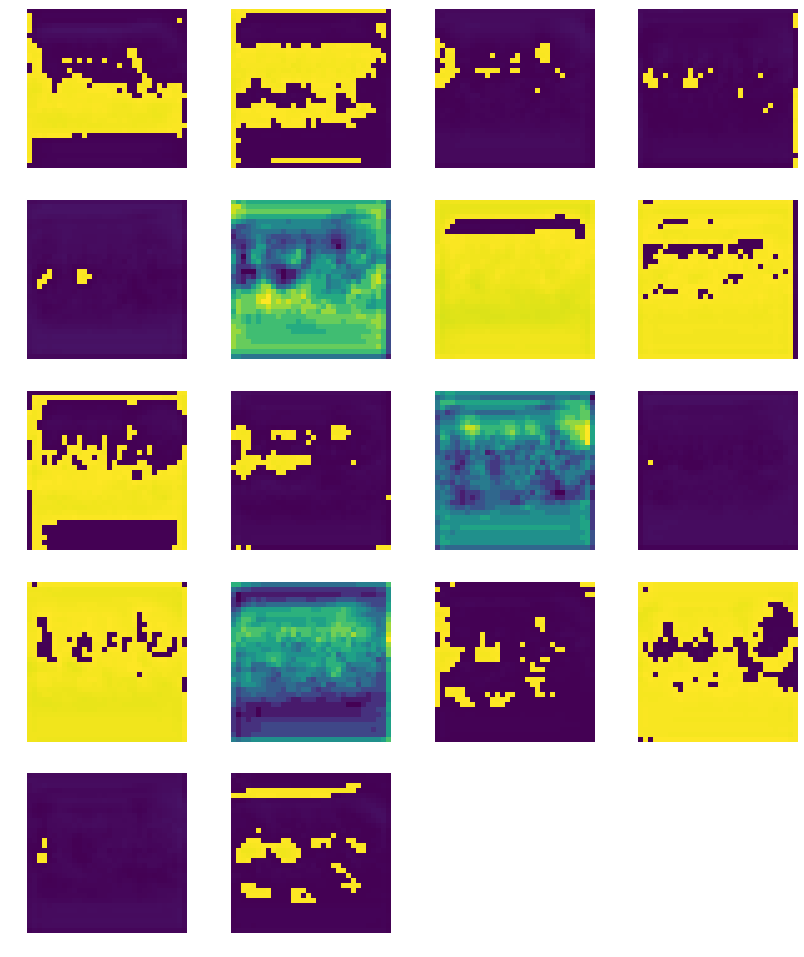

In [21]:
# Backbone feature map
display_images(np.transpose(activations1["class_3"][0,:,:,:], [2, 0, 1]))

## Pooling Layer Activations

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [37]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min: -192.00000  max: 1273.53467  float32
refined_anchors          shape: (1, 6000, 4)          min: -151.03558  max: 1205.21899  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max: 1024.00000  float32
post_nms_anchor_ix       shape: (513,)                min:    0.00000  max: 5987.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


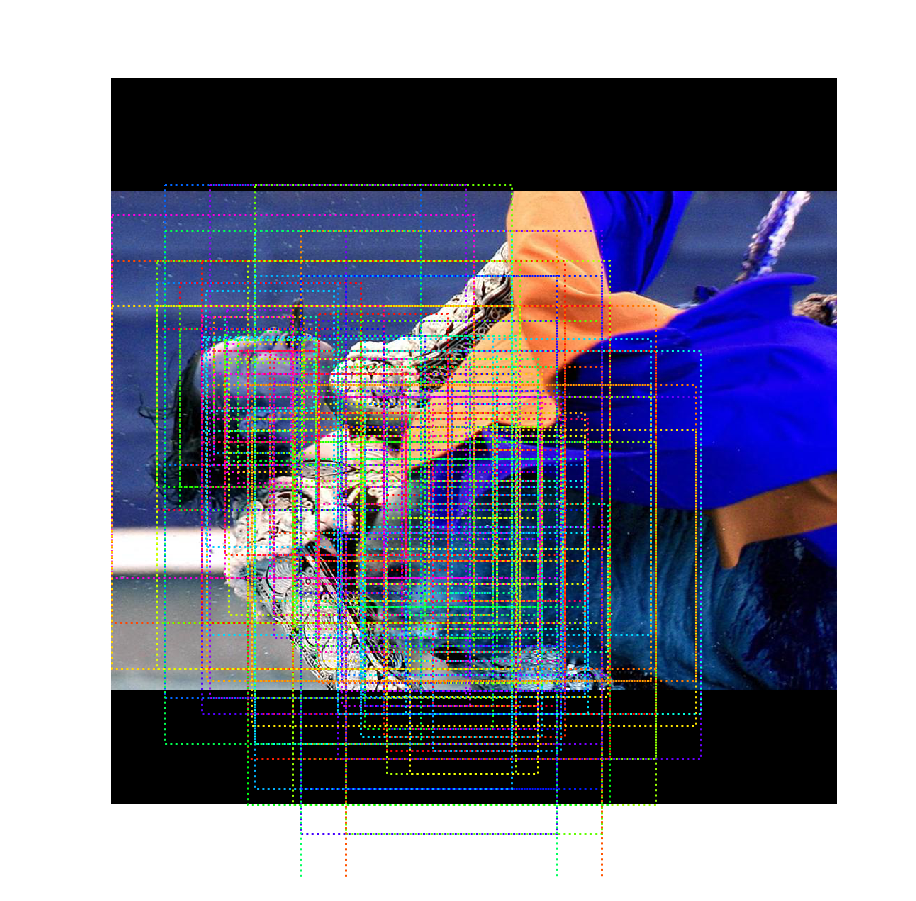

In [38]:
# Show top anchors by score (before refinement)
limit = 200
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
Visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

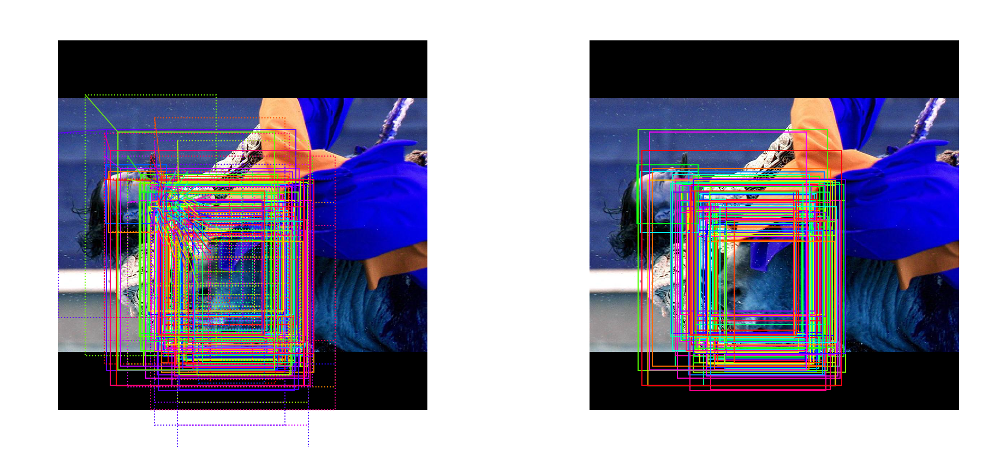

In [39]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 100
ax = get_ax(1, 2)
#pre_nms_anchors = Utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
#refined_anchors = Utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
#refined_anchors_clipped = Utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])

pre_nms_anchors = rpn["pre_nms_anchors"][0]
refined_anchors = rpn["refined_anchors"][0]
refined_anchors_clipped = rpn["refined_anchors_clipped"][0]


Visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
Visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

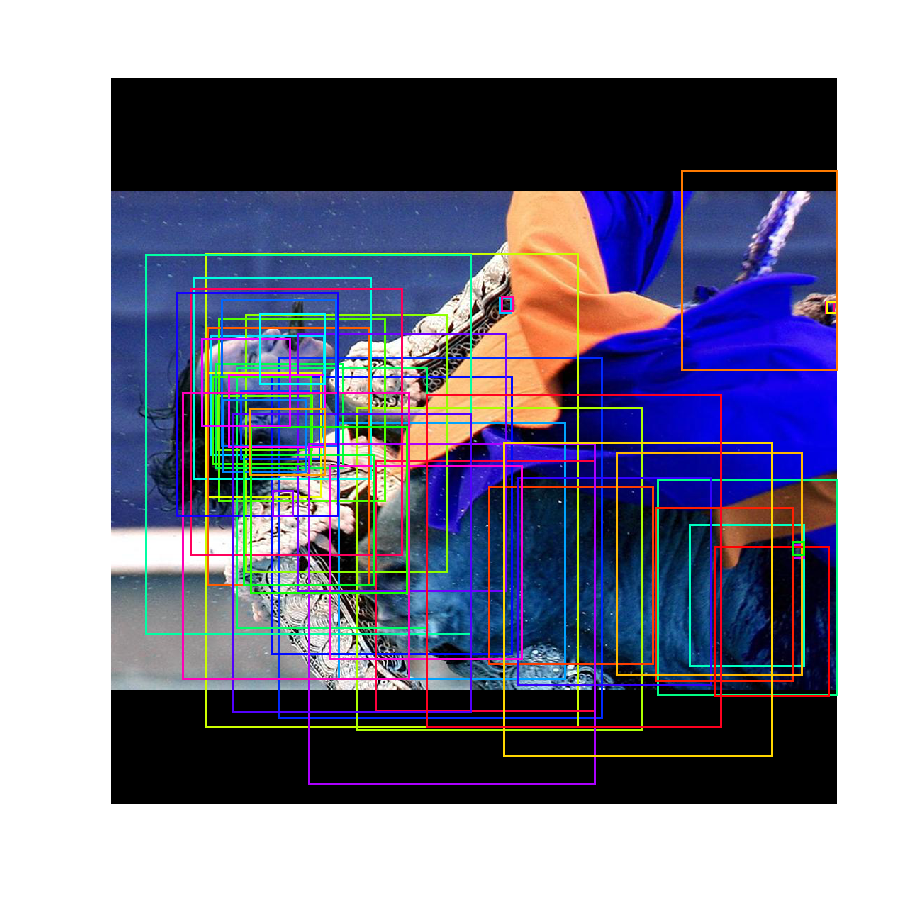

In [40]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
Visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

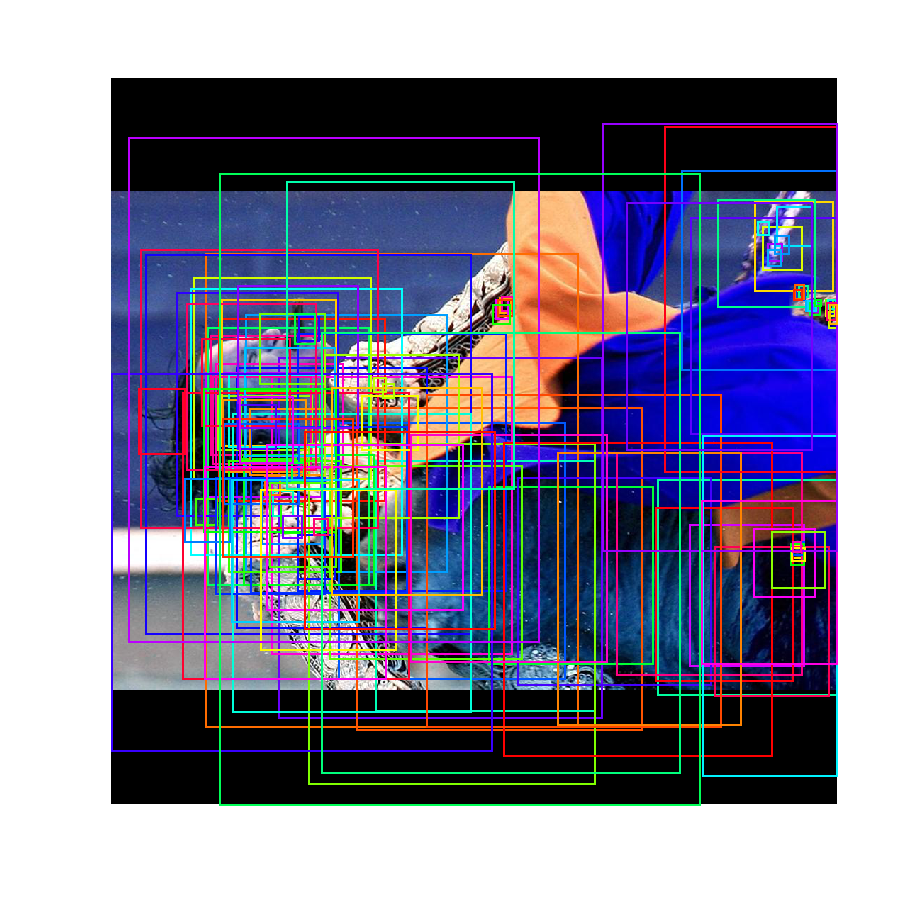

In [41]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 128
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
Visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

In [42]:
# Measure the RPN recall (percent of objects covered by anchors)
# Here we measure recall for 3 different methods:
# - All anchors
# - All refined anchors
# - Refined anchors after NMS
iou_threshold = 0.5

recall, positive_anchor_ids = Utils.compute_recall(model.anchors, gt_bbox, iou_threshold)
print("All Anchors ({:5})       Recall: {:.3f}  Positive anchors: {}".format(
    model.anchors.shape[0], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = Utils.compute_recall(rpn['refined_anchors'][0], gt_bbox, iou_threshold)
print("Refined Anchors ({:5})   Recall: {:.3f}  Positive anchors: {}".format(
    rpn['refined_anchors'].shape[1], recall, len(positive_anchor_ids)))

recall, positive_anchor_ids = Utils.compute_recall(proposals, gt_bbox, iou_threshold)
print("Post NMS Anchors ({:5})  Recall: {:.3f}  Positive anchors: {}".format(
    proposals.shape[0], recall, len(positive_anchor_ids)))


All Anchors (261888)       Recall: 1.000  Positive anchors: 31
Refined Anchors ( 6000)   Recall: 1.000  Positive anchors: 208
Post NMS Anchors (  128)  Recall: 1.000  Positive anchors: 1


## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [43]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("classify_output").output),
    ("deltas", model.keras_model.get_layer("regr_output").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 4)          min:   -0.68180  max:    0.09124  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    0.00000  float32


0 detections: []


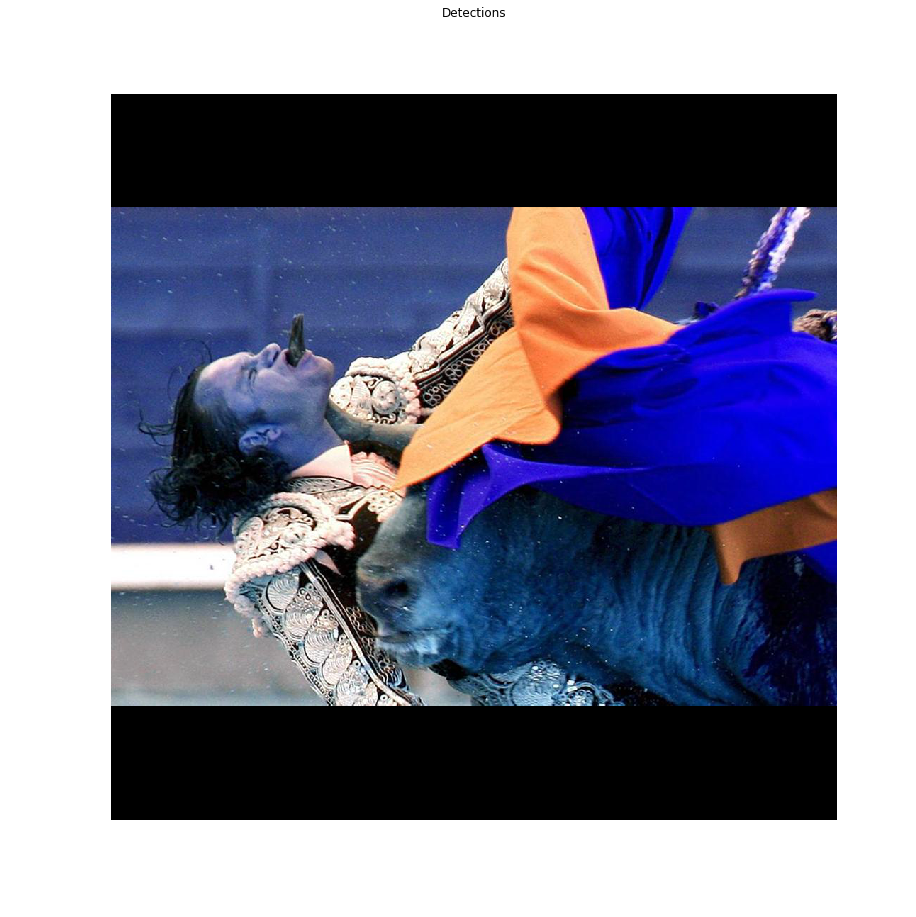

In [44]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
Visualize.draw_boxes(
    image, 
    refined_boxes=Utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [45]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

513 Valid proposals out of 1000
0 Positive ROIs
[('BG', 1000)]


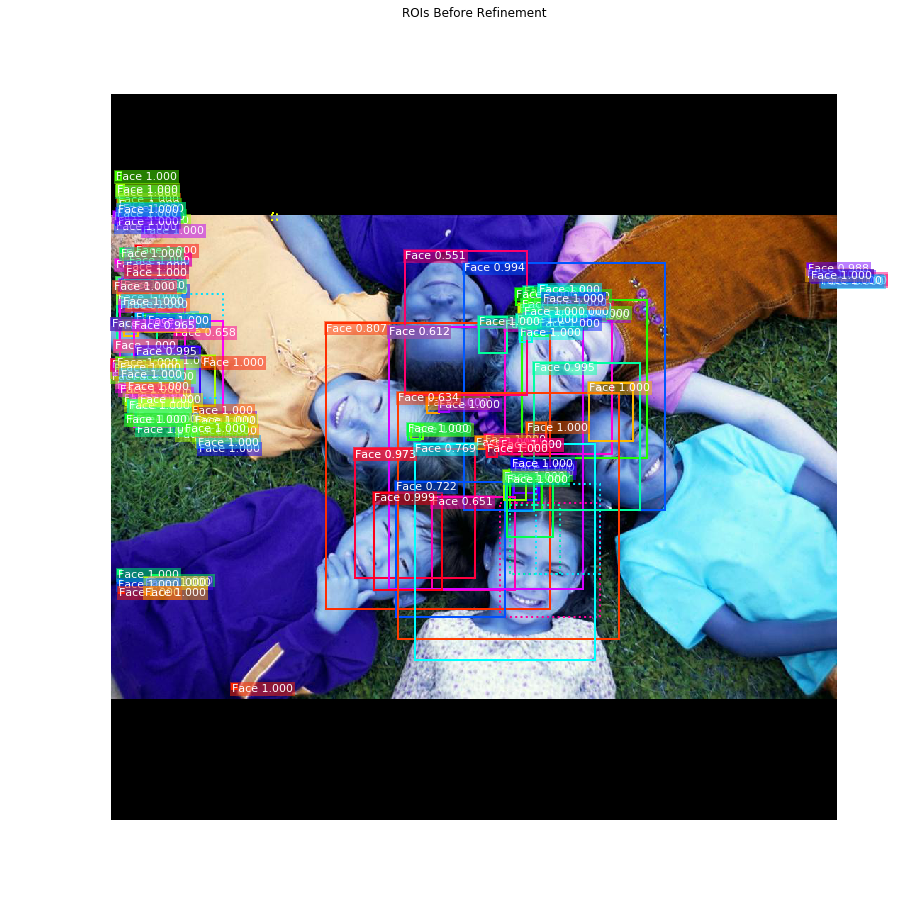

In [49]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
Visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -8.31109  max:    1.89009  float32
refined_proposals        shape: (1000, 4)             min:  -54.00000  max: 1016.00000  int32


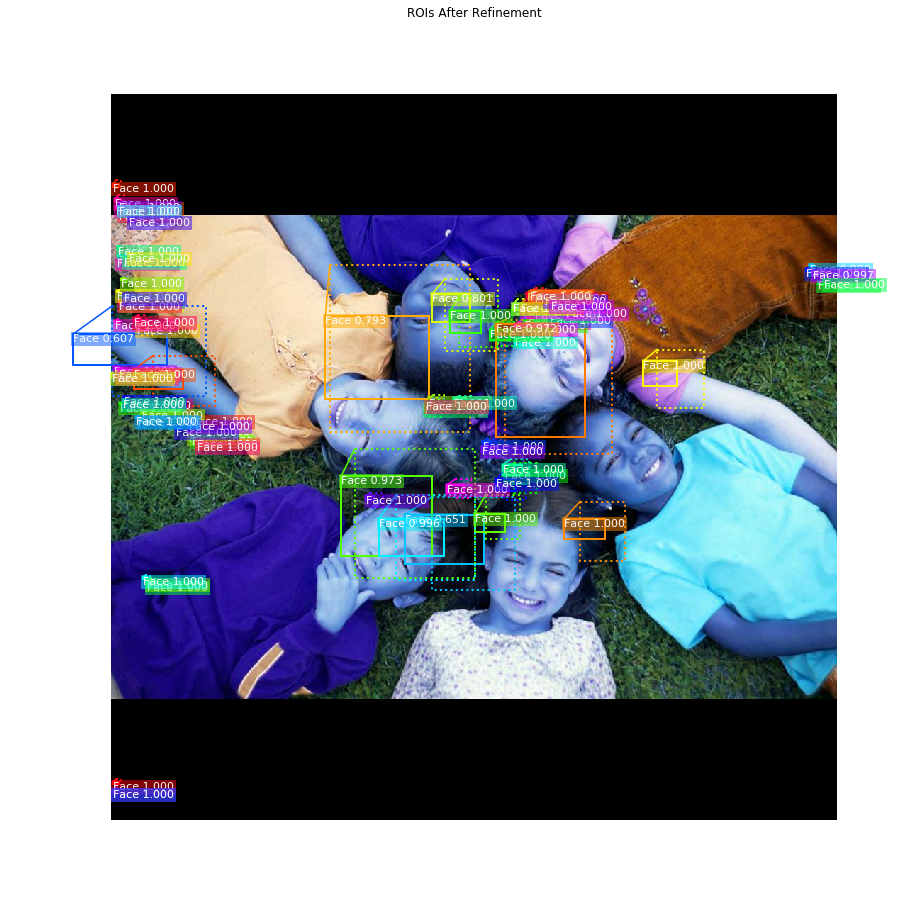

In [50]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0])]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = Utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
ids = np.arange(proposals.shape[0])  # Display all
limit = 100
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
Visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [51]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 952 detections:
[  3   4   6   8   9  11  12  13  14  15  16  17  18  19  20  21  22  23
  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39  40  42
  43  44  45  46  47  48  49  50  52  53  54  55  56  57  58  59  62  63
  64  65  66  68  69  70  71  72  73  75  76  77  78  79  80  81  82  83
  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105 106 107 108 110 111 113 115 116 117 118 119 120 121 122 123
 124 125 126 127 128 129 130 131 132 134 135 136 137 138 139 140 141 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 186 187 188 190 191 192 193 194 195 196 197 198 199
 200 201 202 204 205 206 209 210 211 212 213 214 215 216 217 218 219 220
 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238
 239 240 241 242 243 244 247 248 249 250 251 252 253 254 255 256 257 258
 259 260 261 262 263 264 265 2

In [52]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.8 confidence. Keep 920:
[  4   6   9  12  14  16  19  20  21  22  23  24  25  26  27  28  29  30
  32  34  35  36  37  38  40  42  44  46  47  48  50  55  56  57  58  59
  62  63  64  65  68  69  70  71  73  75  76  77  78  79  80  81  82  83
  85  86  87  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103
 104 105 106 107 108 110 111 113 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 134 135 136 137 139 140 141 143 144 145
 146 147 148 149 151 152 153 154 155 156 157 158 159 160 161 162 163 164
 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182
 183 184 186 187 188 190 191 192 193 194 195 196 197 198 199 200 201 202
 204 205 206 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223
 224 225 226 227 229 230 231 232 233 234 235 236 237 238 239 240 241 242
 243 247 248 249 250 251 252 253 254 255 256 257 258 259 261 262 263 264
 265 266 267 269 270 271 272 273 274 275 276 277 278 279 280 281 282 283
 284 2

#### Per-Class Non-Max Suppression

In [53]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = Utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

Face                  : [  4   6   9  12  14  16  19  20  21  22  23  24  25  26  27  28  29  30
  32  34  35  36  37  38  40  42  44  46  47  48  50  55  56  57  58  59
  62  63  64  65  68  69  70  71  73  75  76  77  78  79  80  81  82  83
  85  86  87  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103
 104 105 106 107 108 110 111 113 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 134 135 136 137 139 140 141 143 144 145
 146 147 148 149 151 152 153 154 155 156 157 158 159 160 161 162 163 164
 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182
 183 184 186 187 188 190 191 192 193 194 195 196 197 198 199 200 201 202
 204 205 206 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223
 224 225 226 227 229 230 231 232 233 234 235 236 237 238 239 240 241 242
 243 247 248 249 250 251 252 253 254 255 256 257 258 259 261 262 263 264
 265 266 267 269 270 271 272 273 274 275 276 277 278 279 280 281 282 283
 284 285 286 287 288 289 29

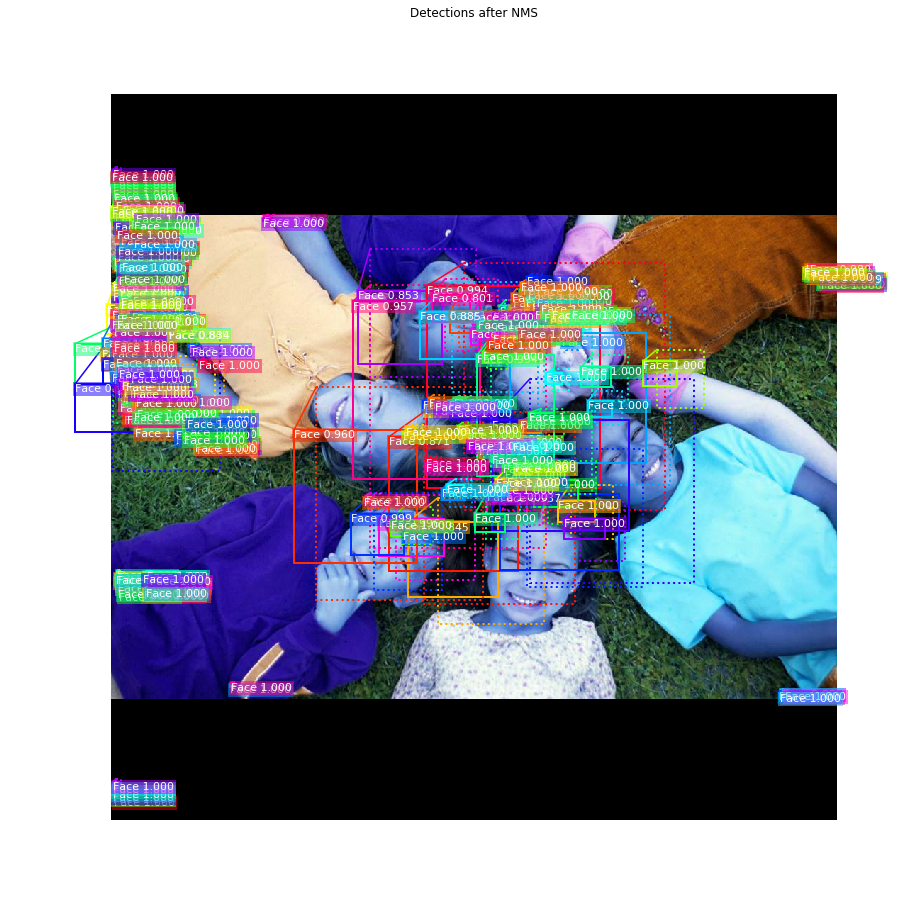

In [54]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
Visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Run Detection

In [27]:
image_id = random.choice(dataset.image_ids)
#image_id = 203
image, image_meta, gt_class_id, gt_bbox =\
    WiderFace.load_image_gt(dataset, config, image_id)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

image ID: Widerface.2377 (2377) 


Processing 1 images


{'rois': array([], shape=(0, 4), dtype=int32),
 'class_ids': array([], dtype=int32),
 'scores': array([], dtype=float32),
 'rpn_class': array([[[9.9941003e-01, 5.9001805e-04],
         [9.9956685e-01, 4.3315120e-04],
         [9.9964356e-01, 3.5647873e-04],
         ...,
         [9.8578227e-01, 1.4217727e-02],
         [9.8781210e-01, 1.2187915e-02],
         [9.9227941e-01, 7.7206120e-03]]], dtype=float32),
 'rpn_bbox': array([[[-1.1515689 , -0.27484134, -0.3055169 ,  0.8084817 ],
         [-0.8332724 , -0.25857186,  0.38916922,  0.11625339],
         [-2.8256614 , -0.31454402,  0.43254253, -3.3424811 ],
         ...,
         [-6.0785    , -5.278952  ,  0.62547076,  2.4072676 ],
         [-7.5636363 , -3.1601274 ,  2.191846  ,  1.3585309 ],
         [-8.985036  , -2.9327698 ,  3.7606003 ,  0.9447609 ]]],
       dtype=float32)}


*** No instances to display *** 

gt_class_id              shape: (1,)                  min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (1, 4)                min:  114.00000  max:  468.00000  float64


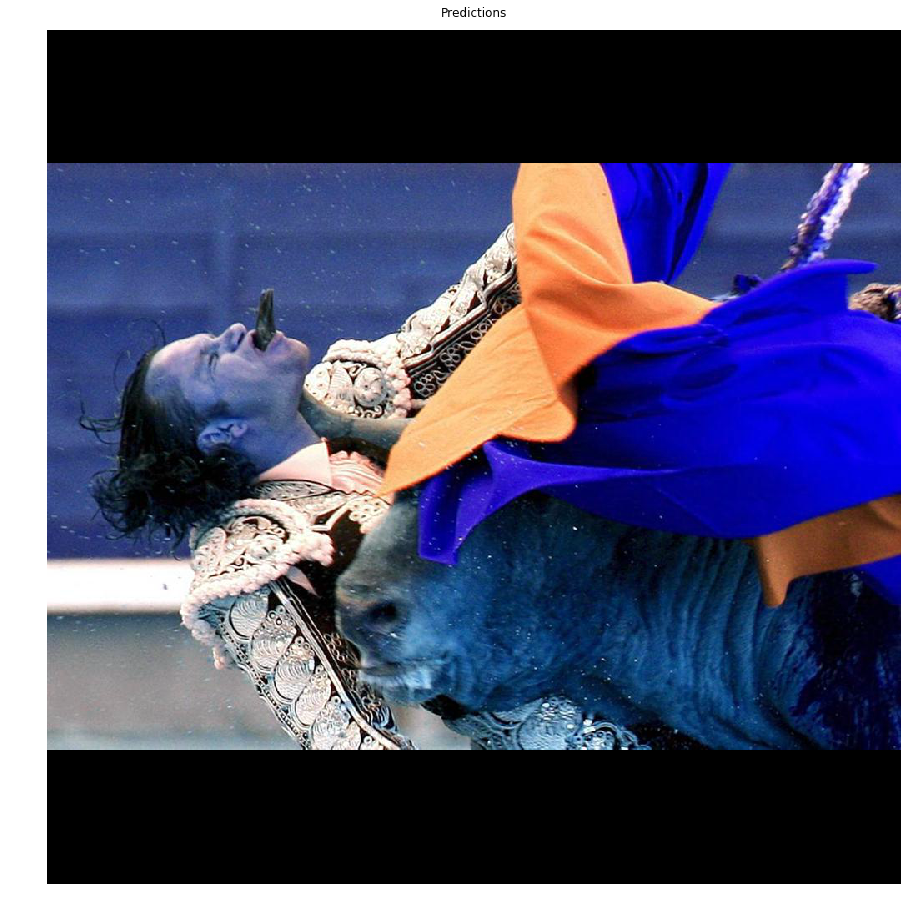

In [28]:
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
display(r)


Visualize.display_instances(image, r['rois'],  None, r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
#log("gt_mask", gt_mask)

### Precision-Recall

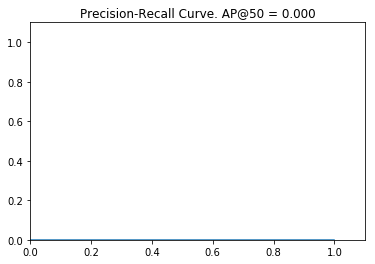

In [25]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = Utils.compute_ap(gt_bbox, gt_class_id, 
                                    r['rois'], r['class_ids'], r['scores'])
Visualize.plot_precision_recall(AP, precisions, recalls)

In [26]:
precisions

array([0., 0., 0.])

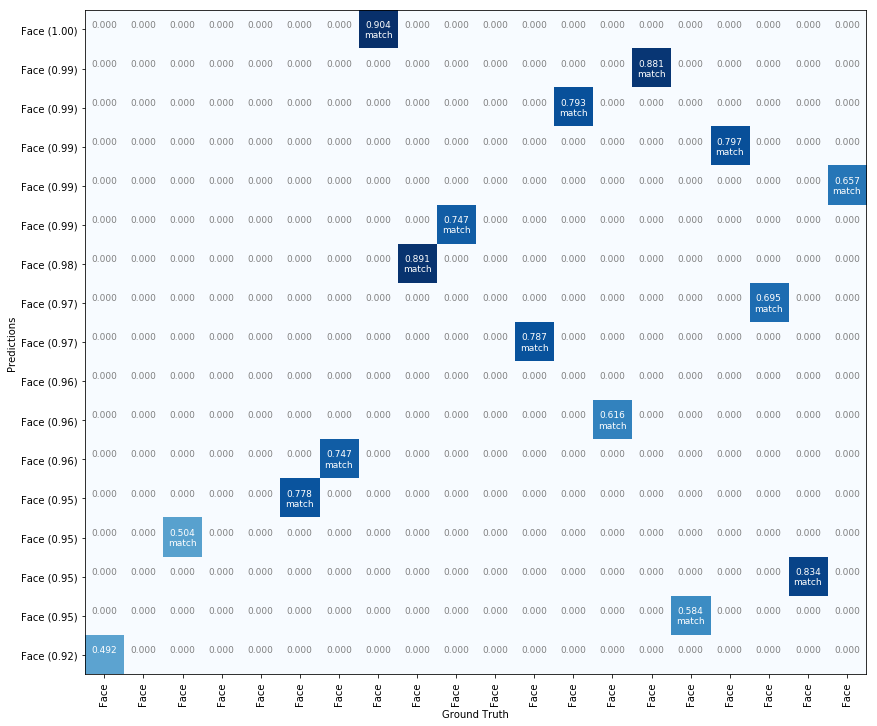

In [22]:
# Grid of ground truth objects and their predictions
Visualize.plot_overlaps(gt_class_id, r['class_ids'], r['scores'],
                        overlaps, dataset.class_names)

### Compute mAP @ IoU=50 on Batch of Images

In [45]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox =\
            Data_generator.load_image_gt(dataset, config,
                                   image_id)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            Utils.compute_ap(gt_bbox, gt_class_id,
                              r['rois'], r['class_ids'], r['scores'])
        APs.append(AP)
    return APs

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, 1000)
APs = compute_batch_ap(image_ids)
print("mAP @ IoU=50: ", np.mean(APs))

AssertionError: 

## Visualize Layer Weights

In [10]:
Visualize.display_weight_stats(model)

WEIGHT NAME,SHAPE,MIN,MAX,STD
conv1/kernel:0,"(7, 7, 3, 64)",-0.1527,+0.1285,+0.0364
conv1/bias:0,"(64,)",-0.0055,+0.0025,+0.0016
bn_conv1/gamma:0,"(64,)",+0.6169,+0.9693,+0.0911
bn_conv1/beta:0,"(64,)",-0.0062,+0.0028,+0.0018
bn_conv1/moving_mean:0*** dead?,"(64,)",+0.0000,+0.0000,+0.0000
bn_conv1/moving_variance:0*** dead?,"(64,)",+1.0000,+1.0000,+0.0000
res2a_branch2a/kernel:0,"(1, 1, 64, 64)",-0.2488,+0.2246,+0.1236
res2a_branch2a/bias:0,"(64,)",-0.0014,+0.0011,+0.0005
bn2a_branch2a/gamma:0,"(64,)",+0.9578,+1.0006,+0.0092
bn2a_branch2a/beta:0,"(64,)",-0.0014,+0.0011,+0.0005


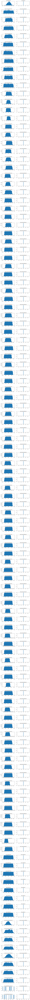

In [11]:
# Pick layer types to display
LAYER_TYPES = ['Conv2D', 'Dense']
# Get layers
layers = model.get_trainable_layers()
layers = list(filter(lambda l: l.__class__.__name__ in LAYER_TYPES, 
                layers))
# Display Histograms
fig, ax = plt.subplots(len(layers), 2, figsize=(10, 3*len(layers)),
                       gridspec_kw={"hspace":1})
for l, layer in enumerate(layers):
    weights = layer.get_weights()
    for w, weight in enumerate(weights):
        tensor = layer.weights[w]
        ax[l, w].set_title(tensor.name)
        _ = ax[l, w].hist(weight[w].flatten(), 50)


## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [ ]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

In [ ]:
# Input image (normalized)
_ = plt.imshow(Utils.unmold_image(activations["input_image"][0],config))

In [ ]:
# Backbone feature map
display_images(np.transpose(activations["res4w_out"][0,:,:,:4], [2, 0, 1]))

In [ ]:
# Histograms of RPN bounding box deltas
plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.title("dy")
_ = plt.hist(activations["rpn_bbox"][0,:,0], 50)
plt.subplot(1, 4, 2)
plt.title("dx")
_ = plt.hist(activations["rpn_bbox"][0,:,1], 50)
plt.subplot(1, 4, 3)
plt.title("dw")
_ = plt.hist(activations["rpn_bbox"][0,:,2], 50)
plt.subplot(1, 4, 4)
plt.title("dh")
_ = plt.hist(activations["rpn_bbox"][0,:,3], 50)

In [ ]:
# Distribution of y, x coordinates of generated proposals
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("y1, x1")
plt.scatter(activations["roi"][0,:,0], activations["roi"][0,:,1])
plt.subplot(1, 2, 2)
plt.title("y2, x2")
plt.scatter(activations["roi"][0,:,2], activations["roi"][0,:,3])
plt.show()